# Dishwasher evaluation

In [1]:
import tensorflow as tf
import tensorflow_addons as tfa

In [2]:
import glob
import functools
import struct
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import cv2
import random
import math
import sys
from tensorflow.keras import layers
from tensorflow.keras.preprocessing import image_dataset_from_directory
from ipywidgets import interact, interactive, fixed, interact_manual, BoundedIntText, Button
import ipywidgets as widgets
import tqdm
import pandas as pd

import time

from importlib import reload

from IPython import display

from PIL import Image

from IPython.display import clear_output

AUTOTUNE = tf.data.AUTOTUNE

In [3]:
sys.path.append('../')

import helper_functions
import my_networks
import plotting

In [4]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1
MIN_DEPTH = 450
# MIN_DEPTH = 0
MAX_DEPTH = 2000
IMG_WIDTH = 1280
IMG_HEIGHT = 720
#IMG_WIDTH_NEW = 256
#IMG_HEIGHT_NEW = 256
IMG_WIDTH_NEW = 512
IMG_HEIGHT_NEW = 512
use_mono = False

In [5]:
data_root_train = '../data/dishwasher2/unpaired/'

In [6]:
def depth_generator(a):
    return helper_functions.depth_generator(a, IMG_HEIGHT, IMG_WIDTH, MIN_DEPTH, MAX_DEPTH)

In [7]:
def rgb_generator(a):
    return helper_functions.rgb_generator(a, IMG_HEIGHT, IMG_WIDTH, False)

In [8]:
def mono_generator(a):
    return helper_functions.rgb_generator(a, IMG_HEIGHT, IMG_WIDTH, True)

In [9]:
def generator(pair):
    return helper_functions.generator(pair, IMG_HEIGHT, IMG_WIDTH, MIN_DEPTH, MAX_DEPTH, False)

In [10]:
opaque_depth_paths = sorted(glob.glob(data_root_train + 'opaque/depth/*.bin'))
opaque_color_paths = sorted(glob.glob(data_root_train + 'opaque/color/*.png'))
opaque_pair_paths = list(zip(opaque_depth_paths, opaque_color_paths))
random.shuffle(opaque_pair_paths)
print(f"Opaque: {len(opaque_pair_paths)}")

Opaque: 31075


In [11]:
opaque_dataset = tf.data.Dataset.from_generator(generator,
                                                output_signature=(
                                                    tf.TensorSpec(shape=(IMG_HEIGHT, IMG_WIDTH, 1), dtype=tf.float64),
                                                    tf.TensorSpec(shape=(IMG_HEIGHT, IMG_WIDTH, 3), dtype=tf.float32)),
                                                args=[opaque_pair_paths])

In [12]:
transparent_depth_paths = sorted(glob.glob(data_root_train + 'transparent/depth/*.bin'))
transparent_color_paths = sorted(glob.glob(data_root_train + 'transparent/color/*.png'))
transparent_pair_paths = list(zip(transparent_depth_paths, transparent_color_paths))
random.shuffle(transparent_pair_paths)
print(f"Transparent: {len(transparent_pair_paths)}")

Transparent: 30548


In [13]:
transparent_dataset = tf.data.Dataset.from_generator(generator,
                                                    output_signature=(
                                                        tf.TensorSpec(shape=(IMG_HEIGHT, IMG_WIDTH, 1), dtype=tf.float64),
                                                        tf.TensorSpec(shape=(IMG_HEIGHT, IMG_WIDTH, 3), dtype=tf.float32)),
                                                    args=[transparent_pair_paths])

In [14]:
def parse_depth_bin(filename):
    return helper_functions.parse_depth_bin(filename, IMG_HEIGHT, IMG_WIDTH, MIN_DEPTH, MAX_DEPTH)

In [15]:
def resize_depth(a):
    return helper_functions.resize_depth(a, IMG_HEIGHT_NEW, IMG_WIDTH_NEW)

In [16]:
def resize_rgb(a):
    return helper_functions.resize_rgb(a, IMG_HEIGHT_NEW, IMG_WIDTH_NEW)

In [17]:
def ds_mapper(depth, color):
    flip = tf.random.uniform([], 0, 1)
    start_idx = tf.experimental.numpy.random.randint(0,IMG_WIDTH-IMG_HEIGHT)
    depth_flip = tf.cond(flip <= 0.5, lambda: depth, lambda: tf.reverse(depth, [1]))
    color_flip = tf.cond(flip <= 0.5, lambda: color, lambda: tf.reverse(color, [1]))
    depth_window = depth_flip[:,start_idx:start_idx+IMG_HEIGHT,:]
    color_window = color_flip[:,start_idx:start_idx+IMG_HEIGHT,:]
    return (tf.image.resize(depth_window, [IMG_WIDTH_NEW, IMG_WIDTH_NEW], method=tf.image.ResizeMethod.BILINEAR), 
            tf.image.rgb_to_grayscale(resize_rgb(color_window)),
            resize_rgb(color_window))

In [18]:
opaque_dataset_rz = opaque_dataset.map(
    ds_mapper
  ).batch(
    BATCH_SIZE
  )

transparent_dataset_rz = transparent_dataset.map(
    ds_mapper
  ).batch(
    BATCH_SIZE
  )

In [19]:
opaque_dataset_rz_iter = iter(opaque_dataset_rz)
transparent_dataset_rz_iter = iter(transparent_dataset_rz)

In [20]:
sample_opaque = next(opaque_dataset_rz_iter)
sample_transparent = next(transparent_dataset_rz_iter)

In [21]:
def plot_depth_bin(img, min_depth=MIN_DEPTH, max_depth=MAX_DEPTH, vis_min=MIN_DEPTH, vis_max=MAX_DEPTH, colorbar=False, save_as=None):
    return helper_functions.plot_depth_bin(img, min_depth, max_depth, vis_min, vis_max, colorbar, save_as)

In [22]:
def plot_gs(img):
    plt.imshow(tf.squeeze(img * 0.5 + 0.5), cmap='gray')
    plt.axis('off')

In [23]:
def plot_color(img):
    plt.imshow(tf.squeeze(img * 0.5 + 0.5))
    plt.axis('off')

In [24]:
next_opaque_button = Button(description="Next (opaque)")
next_transparent_button = Button(description="Next (transparent)")

opaque_dataset_rz_show_iter = iter(opaque_dataset_rz)
transparent_dataset_rz_show_iter = iter(transparent_dataset_rz)

out_opaque = widgets.Output()
out_transparent = widgets.Output()

def show_data_samples_opaque(button):
    with out_opaque:
        clear_output(wait=True)
        opaque = next(opaque_dataset_rz_show_iter)

        plt.figure(figsize=(12, 12))
        
        rows = 1
        cols = 3

        plt.subplot(rows, cols, 1)
        plt.title('OD')
        plot_depth_bin(tf.squeeze(opaque[0]), vis_min=450, vis_max=1000)
        plt.axis('off')

        plt.subplot(rows, cols, 2)
        plt.title('OG')
        plot_gs(opaque[1])

        plt.subplot(rows, cols, 3)
        plt.title('ORGB')
        plot_gs(opaque[2])

        display.display(plt.show())
        
def show_data_samples_transparent(button):
    with out_transparent:
        clear_output(wait=True)
        transparent = next(transparent_dataset_rz_show_iter)

        plt.figure(figsize=(12, 12))
        
        rows = 1
        cols = 3
        
        plt.subplot(rows, cols, 1)
        plt.title('TD')
        plot_depth_bin(tf.squeeze(transparent[0]), vis_min=450, vis_max=1000)
        plt.axis('off')

        plt.subplot(rows, cols, 2)
        plt.title('TG')
        plot_gs(transparent[1])

        plt.subplot(rows, cols, 3)
        plt.title('TRGB')
        plot_color(transparent[2])

        display.display(plt.show())

show_data_samples_opaque(next_opaque_button)
show_data_samples_transparent(next_transparent_button)
    
next_opaque_button.on_click(show_data_samples_opaque)
next_transparent_button.on_click(show_data_samples_transparent)
widgets.VBox([next_opaque_button, out_opaque, next_transparent_button, out_transparent])

# Our test set

In [29]:
data_root_val = '../data/dishwasher2/val/'

In [30]:
def crop_depth(mat):
    m, n, _ = mat.shape
    if m > n:
        margin = int((m - n) / 2)
        return mat[margin:margin+n,:,:]
    elif n > m:
        margin = int((n - m) / 2)
        return mat[:,margin:margin+m,:]
    return mat

In [31]:
transparent_depth_matching_files = sorted(glob.glob(data_root_val + 'transparent/depth/*.bin'))
print(f"Transparent depth test size: {len(transparent_depth_matching_files)}")
transparent_depth_matching = tf.data.Dataset.from_generator(depth_generator,
                                                      args=[transparent_depth_matching_files],
                                                      output_types=tf.float64,
                                                      output_shapes=(IMG_HEIGHT, IMG_WIDTH, 1))
transparent_depth_matching = transparent_depth_matching.map(crop_depth)
transparent_depth_matching = transparent_depth_matching.map(resize_depth)
transparent_depth_matching_max = helper_functions.get_max(list(iter(transparent_depth_matching)))

Transparent depth test size: 26


In [32]:
transparent_rgb_matching_files = sorted(glob.glob(data_root_val + '/transparent/color/*.png'))
print(f"Transparent rgb matching size: {len(transparent_rgb_matching_files)}")
transparent_rgb_matching = [helper_functions.parse_rgb_img(file, IMG_HEIGHT, IMG_WIDTH, mono=use_mono, crop=True) for file in transparent_rgb_matching_files]

Transparent rgb matching size: 26


In [33]:
opaque_depth_matching_files = sorted(glob.glob(data_root_val + '/opaque/depth/*.bin'))
print(f"Opaque depth test size: {len(opaque_depth_matching_files)}")
opaque_depth_matching = tf.data.Dataset.from_generator(depth_generator,
                                                      args=[opaque_depth_matching_files],
                                                      output_types=tf.float64,
                                                      output_shapes=(IMG_HEIGHT, IMG_WIDTH, 1))
opaque_depth_matching = opaque_depth_matching.map(crop_depth)
opaque_depth_matching = opaque_depth_matching.map(resize_depth)
opaque_depth_matching_max = helper_functions.get_max(list(iter(opaque_depth_matching)))

Opaque depth test size: 26


In [34]:
opaque_rgb_matching_files = sorted(glob.glob(data_root_val + '/opaque/color/*.png'))
print(f"Opaque rgb matching size: {len(opaque_rgb_matching_files)}")
opaque_rgb_matching = [helper_functions.parse_rgb_img(file, IMG_HEIGHT, IMG_WIDTH, mono=use_mono, crop=True) for file in opaque_rgb_matching_files]

Opaque rgb matching size: 26


In [35]:
transparent_rgb_matching_cs_rz = np.array([cv2.resize(helper_functions.normalize(img), dsize=(IMG_HEIGHT_NEW, IMG_WIDTH_NEW), interpolation=cv2.INTER_NEAREST) for img in transparent_rgb_matching])

In [36]:
opaque_rgb_matching_cs_rz = np.array([cv2.resize(helper_functions.normalize(img), dsize=(IMG_HEIGHT_NEW, IMG_WIDTH_NEW), interpolation=cv2.INTER_NEAREST) for img in opaque_rgb_matching])

In [37]:
transparent_matching = tf.concat([list(iter(transparent_depth_matching)), transparent_rgb_matching_cs_rz], 3)
opaque_matching = tf.concat([list(iter(opaque_depth_matching)), opaque_rgb_matching_cs_rz], 3)

In [38]:
def generate_ours_transparent():
    return helper_functions.generate_samples(np.squeeze(np.array(list(iter(transparent_depth_matching)))), len(transparent_depth_matching_files), generator_t2o)

In [39]:
def generate_ours_opaque():
    return helper_functions.generate_samples(np.squeeze(np.array(list(iter(opaque_depth_matching)))), len(opaque_depth_matching_files), generator_o2t)

# Network

In [36]:
g_in_channels = 4
g_out_channels = 4
f_in_channels = 4
f_out_channels = 4

generator_t2o = my_networks.unet_generator(g_out_channels, norm_type='instancenorm', input_channels=g_in_channels, size=512)
generator_o2t = my_networks.unet_generator(f_out_channels, norm_type='instancenorm', input_channels=f_in_channels, size=512)

# unet and resnet use the same discriminator
discriminator_t = my_networks.unet_discriminator(norm_type='instancenorm', target=False, channels=4, size=512)
discriminator_o = my_networks.unet_discriminator(norm_type='instancenorm', target=False, channels=4, size=512)

In [37]:
dataset = tf.data.Dataset.zip((transparent_dataset_rz, opaque_dataset_rz))

In [38]:
class MyLRSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):

    def __init__(self, initial_learning_rate, batch_size):
        self.initial_learning_rate = initial_learning_rate
        self.batch_size = batch_size

    def __call__(self, step):
        return tf.cond((step / self.batch_size) < 100, lambda: self.initial_learning_rate, lambda: self.initial_learning_rate - ((step / self.batch_size) - 100) * (self.initial_learning_rate / 100))

In [39]:
# CycleGAN paper uses 2e-4
# LSGAN paper uses 1e-3
generator_t2o_optimizer = tf.keras.optimizers.Adam(MyLRSchedule(2e-4, 1000), beta_1=0.5)
generator_o2t_optimizer = tf.keras.optimizers.Adam(MyLRSchedule(2e-4, 1000), beta_1=0.5)

discriminator_t_optimizer = tf.keras.optimizers.Adam(MyLRSchedule(1e-4, 1000), beta_1=0.5)
discriminator_o_optimizer = tf.keras.optimizers.Adam(MyLRSchedule(1e-4, 1000), beta_1=0.5)

In [40]:
checkpoint_path = "../data/checkpoints/dishwasherRGBD-unet"

In [41]:
ckpt = tf.train.Checkpoint(generator_t2o=generator_t2o,
                           generator_o2t=generator_o2t,
                           discriminator_t=discriminator_t,
                           discriminator_o=discriminator_o,
                           generator_t2o_optimizer=generator_t2o_optimizer,
                           generator_o2t_optimizer=generator_o2t_optimizer,
                           discriminator_t_optimizer=discriminator_t_optimizer,
                           discriminator_o_optimizer=discriminator_o_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored')

Latest checkpoint restored


# Plotting

In [42]:
pair = list(dataset.take(1))
transparent_cache = pair[0][0]
transparent_concat = tf.concat([transparent_cache[0], transparent_cache[2]], 3)
opaque_cache = pair[0][1]
opaque_concat = tf.concat([opaque_cache[0], opaque_cache[2]], 3)

In [43]:
def plot_validation_data(start, rows, color_input, color_output, color_cycle, depth_input, depth_output, depth_cycle, ground_truth=None):
    # cols = 3 if ground_truth is None else 4
    cols = 6 if ground_truth is None else 8
    counter = 1
    plt.subplot(rows, cols, start*cols+counter)
    counter += 1
    if start == 0:
        plt.title('Input Color')
    plt.imshow(color_input)
    plt.axis('off')

    plt.subplot(rows, cols, start*cols+counter)
    counter += 1
    if start == 0:
        plt.title('Generated Color')
    plt.imshow(color_output)
    plt.axis('off')
    
    if ground_truth is not None:
        plt.subplot(rows, cols, start*cols+counter)
        counter += 1
        if start == 0:
            plt.title('Ground Truth Color')
        plt.imshow(ground_truth[:,:,1:4] * 0.5 + 0.5)
        plt.axis('off')
    
    plt.subplot(rows, cols, start*cols+counter)
    counter += 1
    if start == 0:
        plt.title('Color (cycle)')
    plt.imshow(color_cycle)
    plt.axis('off')
    
    plt.subplot(rows, cols, start*cols+counter)
    counter += 1
    if start == 0:
        plt.title('Input Depth')
    plot_depth_bin(depth_input, vis_min=450, vis_max=1000, colorbar=False)
    plt.axis('off')
    
    plt.subplot(rows, cols, start*cols+counter)
    counter += 1
    if start == 0:
        plt.title('Output Depth')
    plot_depth_bin(depth_output, vis_min=450, vis_max=1000, colorbar=False)
    plt.axis('off')
    
    if ground_truth is not None:
        plt.subplot(rows, cols, start*cols+counter)
        counter += 1
        if start == 0:
            plt.title('Depth (ground truth)')
        plot_depth_bin(ground_truth[:,:,0], vis_min=450, vis_max=1000, colorbar=False)
        plt.axis('off')
    
    plt.subplot(rows, cols, start*cols+counter)
    counter += 1
    if start == 0:
        plt.title('Transparent Depth (cycle)')
    plot_depth_bin(depth_cycle, vis_min=450, vis_max=1000, colorbar=False)
    plt.axis('off')
        
        # plt.subplot(rows, cols, start*cols+counter)
        # counter += 1
        # if start == 0:
        #     plt.title('Ground truth - generated')
        # ground_truth_raw = helper_functions.decenter_and_descale_depth_bin(ground_truth, MAX_DEPTH)
        # generated_opaque_depth_raw = helper_functions.decenter_and_descale_depth_bin(generated_opaque_depth, MAX_DEPTH)
        # plt.imshow(ground_truth_raw - generated_opaque_depth_raw, vmin=-60, vmax=60)
        # plt.axis('off')
        # plt.colorbar()

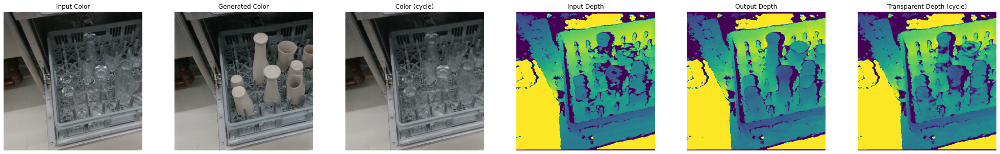

In [44]:
def plot_transparent2opaque(transparent, generator_t2o, start=0, total=1, ground_truth=None):
    if start == 0:
        plt.figure(figsize=(35, math.ceil(total * 5)))
    
    generated_opaque = generator_t2o(transparent)
    cycle_t = generator_o2t(generated_opaque)
    
    transparent_squeeze = tf.squeeze(transparent)
    
    transparent_color = transparent_squeeze[:,:,1:4] * 0.5 + 0.5
    transparent_depth = transparent_squeeze[:,:,0]
    
    generated_opaque_squeeze = tf.squeeze(generated_opaque)
    
    generated_opaque_color = generated_opaque_squeeze[:,:,1:4] * 0.5 + 0.5
    generated_opaque_depth = generated_opaque_squeeze[:,:,0]
    
    cycle_t_squeeze = tf.squeeze(cycle_t)
    cycle_tc = cycle_t_squeeze[:,:,1:4] * 0.5 + 0.5
    cycle_td = cycle_t_squeeze[:,:,0]

    plot_validation_data(start, total, transparent_color, generated_opaque_color, cycle_tc, transparent_depth, generated_opaque_depth, cycle_td, ground_truth)
    
    if total == start+1:
        plt.show()
plot_transparent2opaque(transparent_concat, generator_t2o)

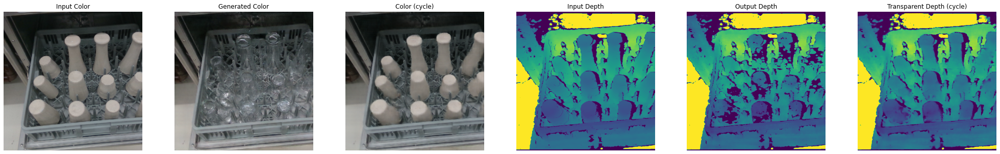

In [45]:
def plot_opaque2transparent(opaque, generator_o2t, start=0, total=1, ground_truth=None):
    if start == 0:
        plt.figure(figsize=(35, math.ceil(total*5)))
    generated_transparent = generator_o2t(opaque)
    cycle_o = generator_t2o(generated_transparent)
    
    opaque_squeeze = tf.squeeze(opaque)
    
    opaque_color = opaque_squeeze[:,:,1:4] * 0.5 + 0.5
    opaque_depth = opaque_squeeze[:,:,0]
    
    generated_transparent_squeeze = tf.squeeze(generated_transparent)
    
    generated_transparent_color = generated_transparent_squeeze[:,:,1:4] * 0.5 + 0.5
    generated_transparent_depth = generated_transparent_squeeze[:,:,0]
    
    cycle_o_squeeze = tf.squeeze(cycle_o)
    cycle_oc = cycle_o_squeeze[:,:,1:4] * 0.5 + 0.5
    cycle_od = cycle_o_squeeze[:,:,0]
    
    plot_validation_data(start, total, opaque_color, generated_transparent_color, cycle_oc, opaque_depth, generated_transparent_depth, cycle_od, ground_truth)
    
    if total == start+1:
        plt.show()
plot_opaque2transparent(opaque_concat, generator_o2t)

In [46]:
def batch_it(tensor):
    return tf.expand_dims(tensor, 0)

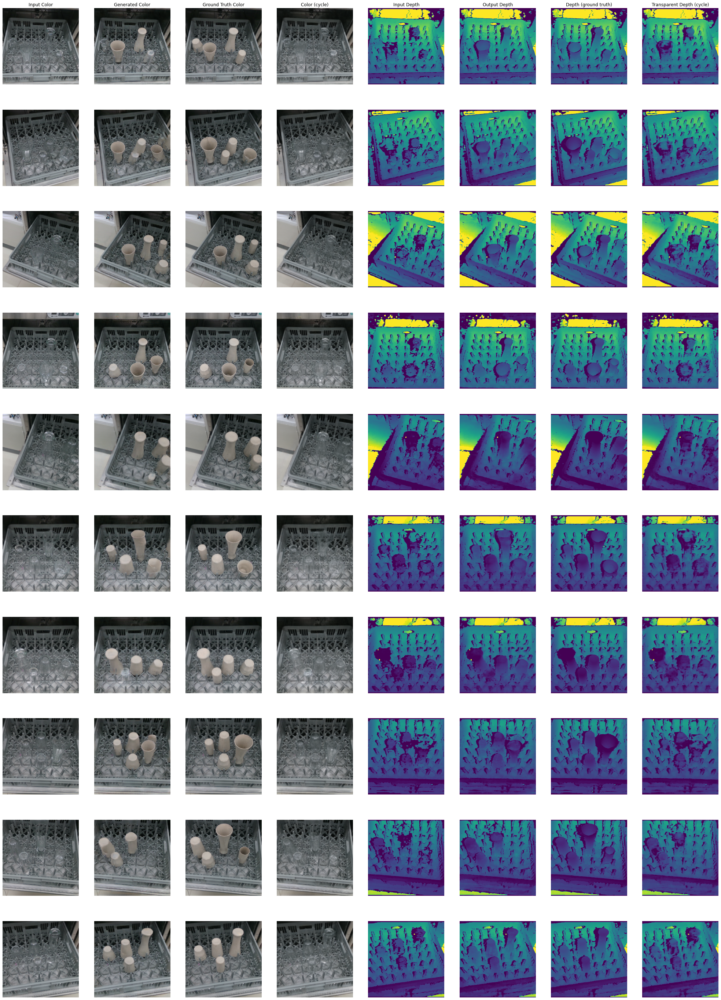

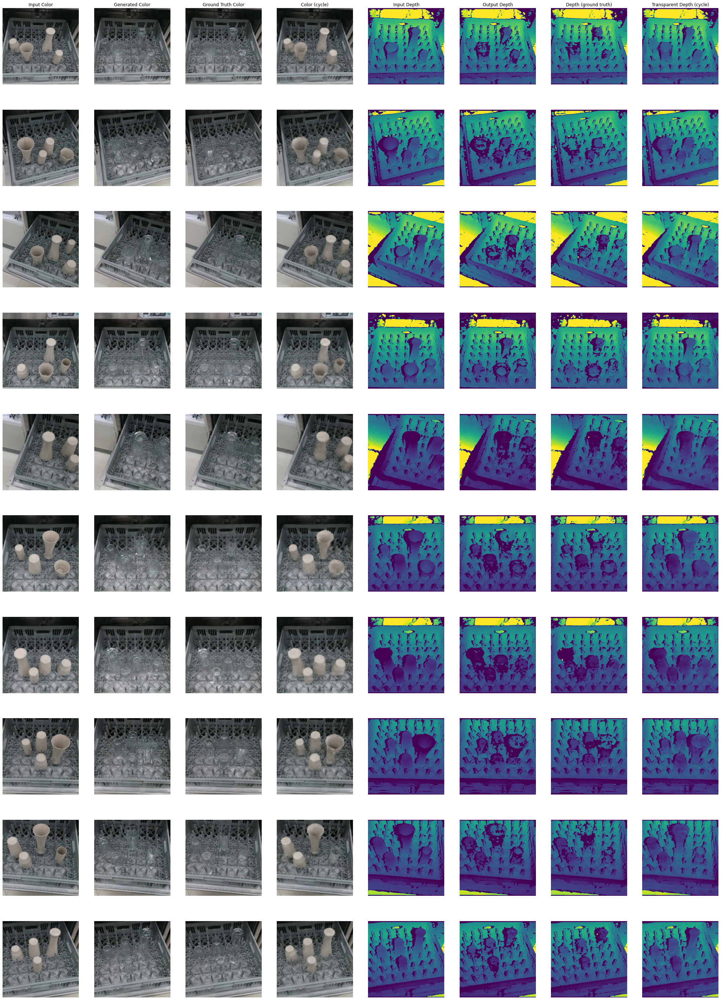

In [47]:
def plot_validation_results():
    for i in range(len(transparent_matching)):
        plot_transparent2opaque(batch_it(transparent_matching[i]), generator_t2o, i, len(transparent_matching), ground_truth=opaque_matching[i])
    for i in range(len(opaque_matching)):
        plot_opaque2transparent(batch_it(opaque_matching[i]), generator_o2t, i, len(opaque_matching), ground_truth=transparent_matching[i])
plot_validation_results()

In [48]:
def plot_generator_losses(gen_t2o_losses, gen_o2t_losses, cycle_losses_o, cycle_losses_t, total_cycle_losses, identity_losses_o2t, identity_losses_t2o, total_gen_t2o_losses, total_gen_o2t_losses):
    plt.figure(figsize=(10, 5))
    plt.plot(list(zip(gen_t2o_losses, 
                      gen_o2t_losses,
                      cycle_losses_o, 
                      cycle_losses_t, 
                      total_cycle_losses,
                      identity_losses_o2t,
                      identity_losses_t2o,
                      total_gen_t2o_losses,
                      total_gen_o2t_losses)))
    plt.title("Color to color generator losses")
    plt.legend(["Transparent color",
                "Opaque color",
                "Cycle O2T2O",
                "Cycle T2O2T",
                "Cycle (total)",
                "O2T Identity",
                "T2O Identity",
                "Total O2T",
                "Total T2O"])
    plt.show()
    
    print("Generator losses")
    last_elem = lambda lst: lst[len(lst)-1]
    print(f"gen_t2o_losses: {last_elem(gen_t2o_losses)}")
    print(f"gen_o2t_losses: {last_elem(gen_o2t_losses)}")
    print(f"cycle_losses_o: {last_elem(cycle_losses_o)}")
    print(f"cycle_losses_t: {last_elem(cycle_losses_t)}")
    print(f"total_cycle_losses: {last_elem(total_cycle_losses)}")
    print(f"identity_losses_o2t: {last_elem(identity_losses_o2t)}")
    print(f"identity_losses_t2o: {last_elem(identity_losses_t2o)}")
    print(f"total_gen_t2o_losses: {last_elem(total_gen_t2o_losses)}")
    print(f"total_gen_o2t_losses: {last_elem(total_gen_o2t_losses)}")

In [49]:
def plot_discriminator_losses(disc_t_losses, disc_o_losses):
    plt.figure(figsize=(10, 5))
    plt.plot(list(zip(disc_t_losses, 
                      disc_o_losses)))
    plt.title("Discriminator losses")
    plt.legend(["Transparent",
                "Opaque"])
    plt.show()
    
    print("Discriminator losses")
    last_elem = lambda lst: lst[len(lst)-1]
    print(f"disc_t_losses: {last_elem(disc_t_losses)}")
    print(f"disc_o_losses: {last_elem(disc_o_losses)}")

In [50]:
def calculate_validation_rmse(generator_t2o, generator_o2t):
    t2o_d_rmses = []
    t2o_c_rmses = []
    o2t_d_rmses = []
    o2t_c_rmses = []
    for i in range(len(transparent_matching)):
        transparent = transparent_matching[i]
        opaque = opaque_matching[i]
        generated_t2o = tf.squeeze(generator_t2o(batch_it(transparent)))
        generated_o2t = tf.squeeze(generator_o2t(batch_it(opaque)))
        t2o_c_rmses.append(np.sqrt(np.mean(np.square(opaque[:,:,1:4] - generated_t2o[:,:,1:4]))))
        t2o_d_rmses.append(np.sqrt(np.mean(np.square(opaque[:,:,0:1] - generated_t2o[:,:,0:1]))))
        o2t_c_rmses.append(np.sqrt(np.mean(np.square(transparent[:,:,1:4] - generated_o2t[:,:,1:4]))))
        o2t_d_rmses.append(np.sqrt(np.mean(np.square(transparent[:,:,0:1] - generated_o2t[:,:,0:1]))))
    return np.mean(t2o_d_rmses), np.mean(t2o_c_rmses), np.mean(o2t_d_rmses), np.mean(o2t_c_rmses)

In [51]:
calculate_validation_rmse(generator_t2o, generator_o2t)

(0.06752296, 0.11867543, 0.07666209, 0.10089169)

In [52]:
def plot_validation_rmse(t2o_d_rmse, t2o_c_rmse, o2t_d_rmse, o2t_c_rmse):
    plt.figure(figsize=(10, 5))
    
    plt.plot(list(zip(t2o_d_rmse, 
                      t2o_c_rmse,
                      o2t_d_rmse,
                      o2t_c_rmse)))
    plt.title("RMSE on validation")
    plt.legend(["T2O Depth",
                "T2O Color",
                "O2T Depth",
                "O2T Color"])
    plt.show()
    
    print("RMSE on validation")
    last_elem = lambda lst: lst[len(lst)-1]
    print(f"t2o_d_rmse: {last_elem(t2o_d_rmse)}")
    print(f"t2o_c_rmse: {last_elem(t2o_c_rmse)}")
    print(f"o2t_d_rmse: {last_elem(o2t_d_rmse)}")
    print(f"o2t_c_rmse: {last_elem(o2t_c_rmse)}")

In [41]:
masks_matching_files = sorted(glob.glob(data_root_val + 'masks/*.bin'))
masks_matching = []
for path in masks_matching_files:
    masks_matching.append(np.fromfile(path).reshape(512,512))

In [40]:
def decenter_and_descale_depth_bin(img):
    return helper_functions.decenter_and_descale_depth_bin(img, MAX_DEPTH)

In [42]:
rmse = lambda error: np.sqrt(np.mean(np.square(error)))
mae = lambda error: np.mean(np.abs(error))
me = lambda error: np.mean(error)
rel = lambda estimated, gt: np.abs(estimated - gt) / gt
def thresh(estimated, gt, theta, mask):
    r = rel(estimated, gt)[mask]
    return len(r[r < theta]) / len(r)

In [43]:
def measure():
    data = []
    n = 10
    for i in range(n):
        generated_opaque = tf.squeeze(generator_t2o(batch_it(transparent_matching[i])))
        opaque = opaque_matching[i]
        depth = generated_opaque[:,:,0]
        depth_raw = decenter_and_descale_depth_bin(depth)
        gt = opaque[:,:,0]
        gt_raw = decenter_and_descale_depth_bin(gt)
        transparent = tf.squeeze(transparent_matching[i])
        baseline = transparent[:,:,0]
        baseline_raw = decenter_and_descale_depth_bin(baseline)
        
        rel_depth_gt = rel(depth_raw, gt_raw)[gt_raw != 450]
        rel_depth_gt_match = rel(depth_raw, gt_raw)[(gt_raw != 450) & (masks_matching[i] == 1)]
        
        data.append([rmse(depth_raw[gt_raw != 450] - gt_raw[gt_raw != 450]),
                     rmse((depth_raw - gt_raw)[(masks_matching[i] == 1) & (gt_raw != 450)]),
                     mae(depth_raw[gt_raw != 450] - gt_raw[gt_raw != 450]),
                     mae((depth_raw - gt_raw)[(masks_matching[i] == 1) & (gt_raw != 450)]),
                     np.mean(rel_depth_gt),
                     np.mean(rel_depth_gt_match),
                     thresh(depth_raw, gt_raw, 0.05, masks_matching[i] == 1),
                     thresh(depth_raw, gt_raw, 0.10, masks_matching[i] == 1),
                     thresh(depth_raw, gt_raw, 0.25, masks_matching[i] == 1),
                     thresh(depth_raw, gt_raw, (math.pow(1.25, 2) - 1), masks_matching[i] == 1),
                     thresh(depth_raw, gt_raw, (math.pow(1.25, 3) - 1), masks_matching[i] == 1)
                    ])
        
        # print(f'Mean depth of predicted: {np.mean(depth_raw)}')
        # print(f'Mean depth of ground truth: {np.mean(gt_raw)}')
        # print(f'Mean depth of baseline: {np.mean(baseline_raw)}')
        # print(f'Mean depth of predicted (masked): {np.mean(depth_masked_raw[masks_matching[i] == 1])}')
        # print(f'Mean depth of ground truth (masked): {np.mean(gt_masked_raw[masks_matching[i] == 1])}')
        # print(f'Mean depth of baseline (masked): {np.mean(baseline_masked_raw[masks_matching[i] == 1])}')
        
    
    plt.show()
    pd.set_option('display.max_columns', 500)
    pd.set_option('display.width', 1000)
    df = pd.DataFrame(data, 
                      columns=["Generated vs GT RMSE", 
                               "Generated vs GT RMSE (masked)", 
                               "Generated vs GT MAE", 
                               "Generated vs GT MAE (masked)", 
                               "Relative error",
                               "Relative error (masked)",
                               "1.05",
                              "1.10",
                              "1.25",
                              "1.25 ** 2",
                              "1.25 ** 3"])
    df.loc['mean'] = df.mean()
    print(df)
measure()

NameError: name 'generator_t2o' is not defined

In [46]:
!pip install numba
import numba

In [44]:
padding = 4
sigma_d = 18
sigma_r = 0.1

In [47]:
@numba.njit
def bilateral_filter(in_img, out_img, x, y, padding, sigma_d, sigma_r):
    for i in range(padding, x-padding):
        for j in range(padding, y-padding):
            nom = 0
            denom = 0
            for k in range(i-padding, i+padding):
                for l in range(j-padding, j+padding):
                    w_i_j_k_l = math.exp( -(((i - k)**2 + (j - l)**2)/(2*sigma_d**2)) - (np.linalg.norm(in_img[i][j] - in_img[k][l])/(2*sigma_r**2)))
                    nom += w_i_j_k_l * in_img[k][l]
                    denom += w_i_j_k_l
            out_img[i][j] = (nom / denom)
    return out_img

In [48]:
@numba.njit
def joint_bilateral_filter(in_img0, in_img1, out_img, x, y, padding, sigma_d, sigma_r):
    for i in range(padding, x-padding):
        for j in range(padding, y-padding):
            nom = 0
            denom = 0
            for k in range(i-padding, i+padding):
                for l in range(j-padding, j+padding):
                    img0_proc = -(((i - k)**2 + (j - l)**2)/(2*sigma_d**2))
                    minus = in_img0[i][j] - in_img0[k][l]
                    img1_norm = np.linalg.norm(minus)
                    img1_proc = img1_norm/(2*sigma_r**2)
                    w_i_j_k_l = math.exp(img0_proc - img1_proc)
                    nom += w_i_j_k_l * in_img1[k][l]
                    denom += w_i_j_k_l
            out_img[i][j] = (nom / denom)
    return out_img

In [49]:
generated_opaque = []
for i in range(1):
        generated_opaque.append(tf.squeeze(generator_t2o(batch_it(transparent_matching[i]))))

NameError: name 'generator_t2o' is not defined

In [62]:
#total_mae_all = 0
#total_mae_masked = 0
#
#total_mae_generated_all = 0
#total_mae_generated_mask = 0
#
#total_mae_generated_all_filter = 0
#total_mae_generated_mask_filter = 0
#
#for i in range(10):
#    depth_raw = decenter_and_descale_depth_bin(transparent_matching[i,:,:,0])
#    gt_raw = decenter_and_descale_depth_bin(opaque_matching[i,:,:,0])
#    generated = generated_opaque[i][:,:,0]
#    generated_filter = joint_bilateral_filter(transparent_matching[i,:,:,1:4].numpy(), generated.numpy(), np.zeros(shape=(512, 512), dtype=float), 512, 512, 19, 16, 0.5)
#    generated_raw = decenter_and_descale_depth_bin(generated)
#    generated_raw_filter = decenter_and_descale_depth_bin(generated_filter)
#    total_mae_all += mae(depth_raw[gt_raw != 450] - gt_raw[gt_raw != 450]) / 10
#    total_mae_masked += mae((depth_raw - gt_raw)[(masks_matching[i] == 1) & (gt_raw != 450)]) / 10
#    total_mae_generated_all += mae(generated_raw[gt_raw != 450] - gt_raw[gt_raw != 450]) / 10
#    total_mae_generated_mask += mae((generated_raw - gt_raw)[(masks_matching[i] == 1) & (gt_raw != 450)]) / 10
#    total_mae_generated_all_filter += mae(generated_raw_filter[gt_raw != 450] - gt_raw[gt_raw != 450]) / 10
#    total_mae_generated_mask_filter += mae((generated_raw_filter - gt_raw)[(masks_matching[i] == 1) & (gt_raw != 450)]) / 10
#
#print(total_mae_all)
#print(total_mae_masked)
#print(total_mae_generated_all)
#print(total_mae_generated_mask)
#print(total_mae_generated_all_filter)
#print(total_mae_generated_mask_filter)
#filtered[(masks_matching[i] == 1) & (gt_raw != 450)]

In [52]:
jbf_res = joint_bilateral_filter(transparent_matching[0,:,:,1:4].numpy(), transparent_matching[0,:,:,0].numpy(), np.zeros(shape=(512, 512), dtype=float), 512, 512, padding, sigma_d, sigma_r)

In [56]:
transparent_matching[0,:,:,0].numpy().shape

(512, 512)

In [57]:
transparent_matching[0,:,:,1:4].numpy().shape

(512, 512, 3)

In [50]:
paddings = range(1, 21, 2)
sigma_ds= [0.5, 1, 2, 4, 8, 16]
sigma_rs= [0.1, 0.5, 1, 2, 4]

best_padding_jbf = paddings[0]
best_sigma_d_jbf = sigma_ds[0]
best_sigma_r_jbf = sigma_rs[0]
best_jbf = -1

best_padding_ours = paddings[0]
best_sigma_d_ours = sigma_ds[0]
best_sigma_r_ours = sigma_rs[0]
best_ours = -1

best_jbfs = []
best_ourses = []

for padding in paddings:
    for sigma_d in sigma_ds:
        for sigma_r in sigma_rs:
            n = 10
            depth_jbf = joint_bilateral_filter(transparent_matching[0,:,:,1:4].numpy(), transparent_matching[0,:,:,0].numpy(), np.zeros(shape=(512, 512), dtype=float), 512, 512, padding, sigma_d, sigma_r)
            depth_ours = joint_bilateral_filter(transparent_matching[0,:,:,1:4].numpy(), generated_opaque[0][:,:,0].numpy(), np.zeros(shape=(512, 512), dtype=float), 512, 512, padding, sigma_d, sigma_r)
            depth_raw_jbf = decenter_and_descale_depth_bin(depth_jbf[padding:512-padding,padding:512-padding])
            depth_raw_ours = decenter_and_descale_depth_bin(depth_ours[padding:512-padding,padding:512-padding])
            gt = opaque_matching[0][:,:,0]
            gt_raw = decenter_and_descale_depth_bin(gt)[padding:512-padding,padding:512-padding]
            data_jbf = mae((depth_raw_jbf - gt_raw)[(masks_matching[0][padding:512-padding,padding:512-padding] == 1) & (gt_raw != 450)])
            data_ours = mae((depth_raw_ours - gt_raw)[(masks_matching[0][padding:512-padding,padding:512-padding] == 1) & (gt_raw != 450)])
            
            if best_jbf == -1:
                print(f'Initial best (JBF): {data_jbf}')
                best_jbf = data_jbf
                best_jbfs.append((padding, sigma_d, sigma_r, data_jbf))
            
            if data_jbf < best_jbf:
                print(f'New best (JBF): {data_jbf}')
                best_jbf = data_jbf
                best_padding_jbf = padding
                best_sigma_d_jbf = sigma_d
                best_sigma_r_jbf = sigma_r
                best_jbfs.append((padding, sigma_d, sigma_r, data_jbf))
            
            if best_ours == -1:
                print(f'Initial best (Ours): {data_ours}')
                best_ours = data_ours
                best_ourses.append((padding, sigma_d, sigma_r, data_ours))
            
            if data_ours < best_ours:
                print(f'New best (Ours): {data_ours}')
                best_ours = data_ours
                best_padding_ours = padding
                best_sigma_d_ours = sigma_d
                best_sigma_r_ours = sigma_r
                best_ourses.append((padding, sigma_d, sigma_r, data_ours))

IndexError: list index out of range

In [61]:
import pickle

In [70]:
def save_stats_input():
    with open('best_jbfs_input', 'wb') as stats_file:
        pickle.dump(best_jbfs, stats_file)

In [76]:
def save_stats_output():
    with open('best_jbfs_output', 'wb') as stats_file:
        pickle.dump(best_ourses, stats_file)

In [62]:
with open('best_jbfs_input', "rb") as stats_file:
    best_jbfs = pickle.load(stats_file)

In [63]:
with open('best_jbfs_output', "rb") as stats_file:
    best_ourses = pickle.load(stats_file)

In [64]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
print(pd.DataFrame(best_jbfs, 
                   columns=['padding', 'sigma_d', 'sigma_r', 'MAE']))

    padding  sigma_d  sigma_r        MAE
0         1      0.5      0.1  70.429817
1         1      0.5      0.5  69.321098
2         1      0.5      1.0  69.167816
3         1      0.5      2.0  69.122566
4         1      0.5      4.0  69.110931
5         1      1.0      0.5  67.421448
6         1      1.0      1.0  67.275932
7         1      1.0      2.0  67.244881
8         1      1.0      4.0  67.237740
9         1      2.0      0.5  67.168671
10        1      2.0      1.0  67.073875
11        1      2.0      2.0  67.056496
12        1      2.0      4.0  67.052811
13        1      4.0      2.0  67.039711
14        1      4.0      4.0  67.036919
15        1      8.0      4.0  67.034996
16        1     16.0      4.0  67.034683
17        3      1.0      0.5  63.736511
18        3      1.0      1.0  63.465248
19        3      1.0      2.0  63.400375
20        3      1.0      4.0  63.384712
21        3      2.0      0.5  60.263100
22        3      2.0      1.0  59.990814
23        3     

In [65]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
print(pd.DataFrame(best_ourses, 
                   columns=['padding', 'sigma_d', 'sigma_r', 'MAE']))

    padding  sigma_d  sigma_r        MAE
0         1      0.5      0.1  47.781834
1         1      0.5      0.5  47.319866
2         1      0.5      1.0  47.252888
3         1      0.5      2.0  47.233654
4         1      0.5      4.0  47.228569
5         1      1.0      0.5  46.461029
6         1      1.0      1.0  46.398113
7         1      1.0      2.0  46.383514
8         1      1.0      4.0  46.380123
9         1      2.0      0.5  46.326687
10        1      2.0      1.0  46.279869
11        1      2.0      2.0  46.272457
12        1      2.0      4.0  46.271248
13        1      4.0      1.0  46.265106
14        1      4.0      2.0  46.260567
15        1      4.0      4.0  46.259789
16        1      8.0      2.0  46.258488
17        1      8.0      4.0  46.257828
18        1     16.0      4.0  46.257408
19        3      1.0      0.5  45.531963
20        3      1.0      1.0  45.479553
21        3      1.0      2.0  45.471397
22        3      1.0      4.0  45.469570
23        3     

In [68]:
from tqdm.notebook import trange, tqdm

In [70]:
overall_mae_jbf = []
masked_mae_jbf = []
overall_rmse_jbf = []
masked_rmse_jbf = []
vol_jbf_complete = []
for i in tqdm(range(len(best_jbfs))):
    b = best_jbfs[i]
    n = 10
    overall_mae_total_jbf = []
    masked_mae_total_jbf = []
    overall_rmse_total_jbf = []
    masked_rmse_total_jbf = []
    vol_jbf = []
    for i in range(n):
        depth_jbf = joint_bilateral_filter(transparent_matching[i,:,:,1:4].numpy(), transparent_matching[i,:,:,0].numpy(), np.zeros(shape=(512, 512), dtype=float), 512, 512, b[0], b[1], b[2])
        depth_variance_jbf = cv2.Laplacian(depth_jbf[b[0]:512-b[0],b[0]:512-b[0]], cv2.CV_64F).var()
        vol_jbf.append(depth_variance_jbf)
        depth_raw_jbf = decenter_and_descale_depth_bin(depth_jbf)[b[0]:512-b[0],b[0]:512-b[0]]
        gt = opaque_matching[i]
        gt_raw = decenter_and_descale_depth_bin(gt)[b[0]:512-b[0],b[0]:512-b[0],0]
        overall_mae_total_jbf.append(mae((depth_raw_jbf - gt_raw)[(gt_raw != 450)]))
        masked_mae_total_jbf.append(mae((depth_raw_jbf - gt_raw)[(masks_matching[i][b[0]:512-b[0],b[0]:512-b[0]] == 1) & (gt_raw != 450)]))
        overall_rmse_total_jbf.append(rmse((depth_raw_jbf - gt_raw)[(gt_raw != 450)]))
        masked_rmse_total_jbf.append(rmse((depth_raw_jbf - gt_raw)[(masks_matching[i][b[0]:512-b[0],b[0]:512-b[0]] == 1) & (gt_raw != 450)]))
    
    mean_vol = np.mean(vol_jbf)
    mean_overall_mae_total_jbf = np.mean(overall_mae_total_jbf)
    mean_masked_mae_total_jbf = np.mean(masked_mae_total_jbf)
    
    mean_overall_rmse_total_jbf = np.mean(overall_rmse_total_jbf)
    mean_masked_rmse_total_jbf = np.mean(masked_rmse_total_jbf)
    
    vol_jbf_complete.append(mean_vol)
    overall_mae_jbf.append(mean_overall_mae_total_jbf)
    masked_mae_jbf.append(mean_masked_mae_total_jbf)
    overall_rmse_jbf.append(mean_overall_rmse_total_jbf)
    masked_rmse_jbf.append(mean_masked_rmse_total_jbf)
    
    print(f'Mean vol: {mean_vol}, mean overall mae: {mean_overall_mae_total_jbf}, mean masked mae: {mean_masked_mae_total_jbf}, mean overall rmse: {mean_overall_rmse_total_jbf}, mean masked rmse: {mean_masked_rmse_total_jbf}')

  0%|          | 0/74 [00:00<?, ?it/s]

Mean vol: 0.009836896100401402, mean overall mae: 20.513774871826172, mean masked mae: 56.3718147277832, mean overall rmse: 59.658843994140625, mean masked rmse: 80.34212493896484
Mean vol: 0.007327246863366631, mean overall mae: 20.44506072998047, mean masked mae: 55.54608917236328, mean overall rmse: 58.68162155151367, mean masked rmse: 79.32418823242188
Mean vol: 0.007061459296679493, mean overall mae: 20.44830322265625, mean masked mae: 55.4549446105957, mean overall rmse: 58.58762741088867, mean masked rmse: 79.20886993408203
Mean vol: 0.006986538057690374, mean overall mae: 20.450481414794922, mean masked mae: 55.429603576660156, mean overall rmse: 58.56201934814453, mean masked rmse: 79.17646026611328
Mean vol: 0.006967319436472029, mean overall mae: 20.4511661529541, mean masked mae: 55.42311477661133, mean overall rmse: 58.55553436279297, mean masked rmse: 79.16813659667969
Mean vol: 0.0028750159816536046, mean overall mae: 20.757549285888672, mean masked mae: 54.1012649536132

In [83]:
overall_mae_ours = []
masked_mae_ours = []
overall_rmse_ours = []
masked_rmse_ours = []
vol_ours_complete = []


for i in tqdm(range(len(best_jbfs))):
    b = best_jbfs[i]
    n = 10
    overall_mae_total_ours = []
    masked_mae_total_ours = []
    overall_rmse_total_ours = []
    masked_rmse_total_ours = []
    vol_ours = []
    for i in range(n):
        depth_ours  = joint_bilateral_filter(transparent_matching[i,:,:,1:4].numpy(), generated_opaque[i][:,:,0].numpy(), np.zeros(shape=(512, 512), dtype=float), 512, 512, b[0], b[1], b[2])
        depth_variance_ours = cv2.Laplacian(depth_ours[b[0]:512-b[0],b[0]:512-b[0]], cv2.CV_64F).var()
        vol_ours.append(depth_variance_ours)
        depth_raw_ours = decenter_and_descale_depth_bin(depth_ours)[b[0]:512-b[0],b[0]:512-b[0]]
        gt = opaque_matching[i]
        gt_raw = decenter_and_descale_depth_bin(gt)[b[0]:512-b[0],b[0]:512-b[0],0]
        overall_mae_total_ours.append(mae((depth_raw_ours - gt_raw)[(gt_raw != 450)]))
        masked_mae_total_ours.append(mae((depth_raw_ours - gt_raw)[(masks_matching[i][b[0]:512-b[0],b[0]:512-b[0]] == 1) & (gt_raw != 450)]))
        overall_rmse_total_ours.append(rmse((depth_raw_ours - gt_raw)[(gt_raw != 450)]))
        masked_rmse_total_ours.append(rmse((depth_raw_ours - gt_raw)[(masks_matching[i][b[0]:512-b[0],b[0]:512-b[0]] == 1) & (gt_raw != 450)]))
        
    mean_vol = np.mean(vol_ours)
    mean_overall_mae_total_ours = np.mean(overall_mae_total_ours)
    mean_masked_mae_total_ours = np.mean(masked_mae_total_ours)
    
    mean_overall_rmse_total_ours = np.mean(overall_rmse_total_ours)
    mean_masked_rmse_total_ours = np.mean(masked_rmse_total_ours)
    
    vol_ours_complete.append(mean_vol)
    overall_mae_ours.append(mean_overall_mae_total_ours)
    masked_mae_ours.append(mean_masked_mae_total_ours)
    overall_rmse_ours.append(mean_overall_rmse_total_ours)
    masked_rmse_ours.append(mean_masked_rmse_total_ours)
    
    print(f'Mean vol: {mean_vol}, mean overall mae: {mean_overall_mae_total_ours}, mean masked mae: {mean_masked_mae_total_ours}, mean overall rmse: {mean_overall_rmse_total_ours}, mean masked rmse: {mean_masked_rmse_total_ours}')

  0%|          | 0/74 [00:00<?, ?it/s]

Mean vol: 0.00799658686163044, mean overall mae: 27.932287216186523, mean masked mae: 36.83335494995117, mean overall rmse: 58.380516052246094, mean masked rmse: 54.33642578125
Mean vol: 0.005919536646133481, mean overall mae: 27.282909393310547, mean masked mae: 36.48193359375, mean overall rmse: 57.53313064575195, mean masked rmse: 53.73366165161133
Mean vol: 0.005669179477803628, mean overall mae: 27.199209213256836, mean masked mae: 36.438533782958984, mean overall rmse: 57.43672561645508, mean masked rmse: 53.65972900390625
Mean vol: 0.005597139667350771, mean overall mae: 27.175281524658203, mean masked mae: 36.42611312866211, mean overall rmse: 57.409454345703125, mean masked rmse: 53.638755798339844
Mean vol: 0.00557857073737107, mean overall mae: 27.169137954711914, mean masked mae: 36.422943115234375, mean overall rmse: 57.402488708496094, mean masked rmse: 53.63338088989258
Mean vol: 0.002371309662160055, mean overall mae: 26.455602645874023, mean masked mae: 35.902217864990

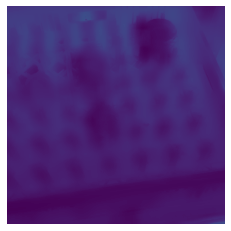

In [93]:
plot_depth_bin(depth_jbf[19:512-19,19:512-19])

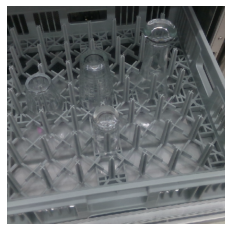

In [102]:
plot_color(transparent_matching[9,19:512-19,19:512-19,1:4])

In [86]:
def save_measures():
    with open('jbf_measures', 'wb') as stats_file:
        params = dict()
        params['overall_mae_ours'] = overall_mae_ours
        params['masked_mae_ours'] = masked_mae_ours
        params['overall_rmse_ours'] = overall_rmse_ours
        params['masked_rmse_ours'] = masked_rmse_ours
        params['vol_ours_complete'] = vol_ours_complete
        params['overall_mae_jbf'] = overall_mae_jbf
        params['masked_mae_jbf'] = masked_mae_jbf
        params['overall_rmse_jbf'] = overall_rmse_jbf
        params['masked_rmse_jbf'] = masked_rmse_jbf
        params['vol_jbf_complete'] = vol_jbf_complete
        pickle.dump(params, stats_file)

In [84]:
def load_measures():
    with open('jbf_measures', 'wb') as stats_file:
        params = pickle.load(stats_file)
        overall_mae_ours = params['overall_mae_ours']
        masked_mae_ours = params['masked_mae_ours']
        overall_rmse_ours = params['overall_rmse_ours']
        masked_rmse_ours = params['masked_rmse_ours']
        vol_ours_complete = params['vol_ours_complete']
        overall_mae_jbf = params['overall_mae_jbf']
        masked_mae_jbf = params['masked_mae_jbf']
        overall_rmse_jbf = params['overall_rmse_jbf']
        masked_rmse_jbf = params['masked_rmse_jbf']
        vol_jbf_complete = params['vol_jbf_complete']
load_measures()

In [85]:
params

{'overall_mae_ours': [27.932287,
  27.28291,
  27.19921,
  27.175282,
  27.169138,
  26.455603,
  26.427235,
  26.42658,
  26.427013,
  26.51659,
  26.52889,
  26.540121,
  26.543545,
  26.5934,
  26.597507,
  26.612492,
  26.616327,
  25.50463,
  25.49425,
  25.499401,
  25.50145,
  25.9281,
  26.019901,
  26.05972,
  26.071136,
  26.337078,
  26.479908,
  26.536015,
  26.551716,
  26.63523,
  26.695904,
  26.712757,
  26.677036,
  26.73885,
  26.755981,
  26.183706,
  26.335337,
  26.397144,
  26.414661,
  27.373251,
  27.680548,
  27.795166,
  27.8269,
  27.890844,
  28.251673,
  28.383677,
  28.419933,
  28.413334,
  28.549854,
  27.976719,
  28.399637,
  28.556713,
  28.600025,
  29.148441,
  29.702942,
  29.902607,
  29.515568,
  30.10618,
  30.31668,
  29.796238,
  30.495447,
  30.745077,
  30.490503,
  31.256292,
  30.280308,
  31.082434,
  31.386494,
  32.294643,
  30.591965,
  31.46604,
  32.18016,
  32.927376,
  33.640358,
  34.310978],
 'masked_mae_ours': [36.833355,
  36.4

In [60]:
variance_of_laplacian = []
for i in tqdm.notebook.tqdm(range(len(best))):
    b = best[i]
    n = 10
    vol = []
    for i in range(n):
        depth = joint_bilateral_filter(transparent_matching[i,:,:,1:4].numpy(), transparent_matching[i,:,:,0].numpy(), np.zeros(shape=(512, 512), dtype=float), 512, 512, b[0], b[1], b[2])
        depth_variance = cv2.Laplacian(depth[b[0]:512-b[0],b[0]:512-b[0]], cv2.CV_64F).var()
        vol.append(depth_variance)
        print(f'Sample VOL: {depth_variance}')
    mean_vol = np.mean(vol)
    print(f'Mean VOL: {depth_variance}')
    variance_of_laplacian.append(mean_vol)

AttributeError: module 'tqdm' has no attribute 'notebook'

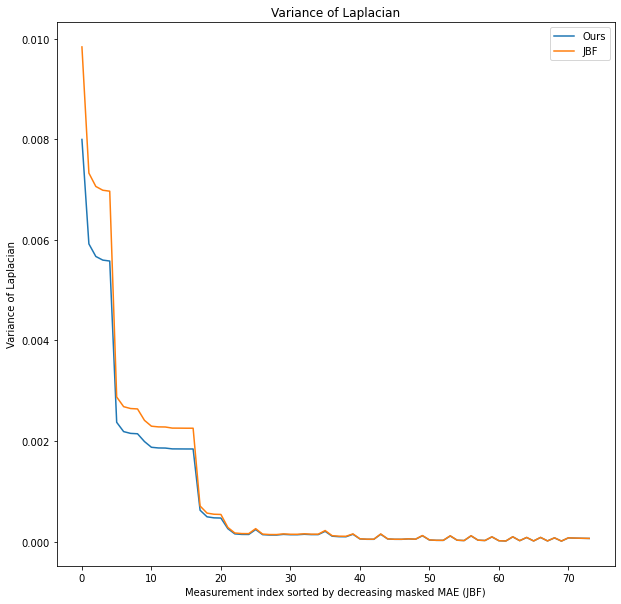

In [88]:
plt.figure(figsize=(10, 10))

plt.plot(list(zip(vol_ours_complete, vol_jbf_complete)))
plt.title("Variance of Laplacian")
plt.legend(["Ours", "JBF"])
plt.xlabel('Measurement index sorted by decreasing masked MAE (JBF)')
plt.ylabel('Variance of Laplacian')
plt.show()

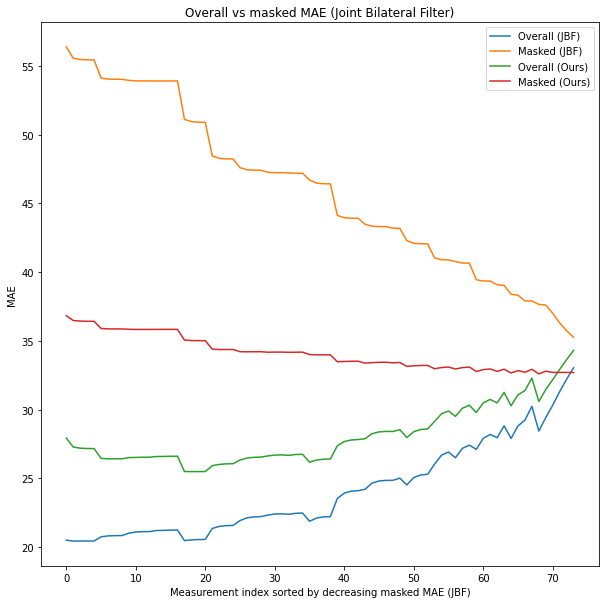

In [89]:
plt.figure(figsize=(10, 10))

plt.plot(list(zip(overall_mae_jbf, 
                  masked_mae_jbf,
                  overall_mae_ours,
                  masked_mae_ours)))
plt.title("Overall vs masked MAE (Joint Bilateral Filter)")
plt.legend(["Overall (JBF)",
            "Masked (JBF)", 
            "Overall (Ours)",
            "Masked (Ours)"])
plt.xlabel('Measurement index sorted by decreasing masked MAE (JBF)')
plt.ylabel('MAE')
plt.show()

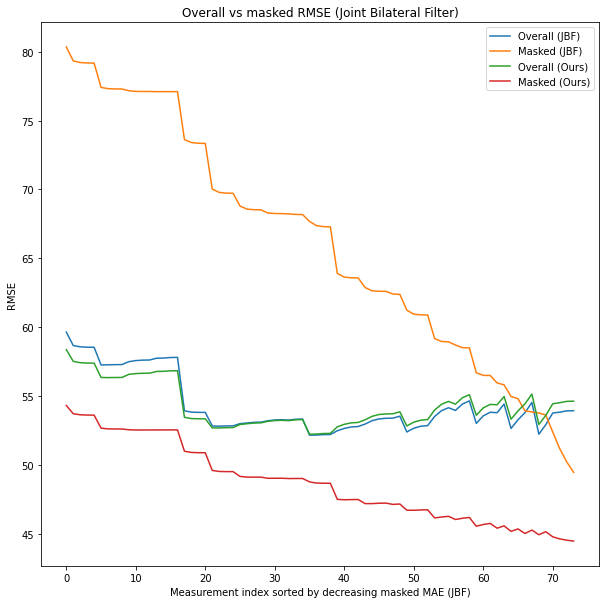

In [95]:
plt.figure(figsize=(10, 10))

plt.plot(list(zip(overall_rmse_jbf, 
                  masked_rmse_jbf,
                  overall_rmse_ours,
                  masked_rmse_ours)))
plt.title("Overall vs masked RMSE (Joint Bilateral Filter)")
plt.legend(["Overall (JBF)",
            "Masked (JBF)", 
            "Overall (Ours)",
            "Masked (Ours)"])
plt.xlabel('Measurement index sorted by decreasing masked MAE (JBF)')
plt.ylabel('RMSE')
plt.show()

In [68]:
var_of_laps = []
for i in range(10):
    var_of_laps.append(cv2.Laplacian(opaque_matching[0].numpy(), cv2.CV_32F).var())
print(np.mean(var_of_laps))

0.026013792


In [73]:
jbf0 = joint_bilateral_filter(transparent_matching[0,:,:,1:4].numpy(), transparent_matching[0,:,:,0].numpy(), np.zeros(shape=(512, 512), dtype=float), 512, 512, 15, 16, 0.5)

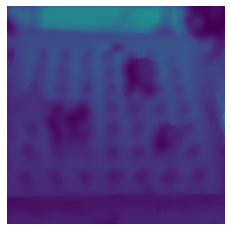

In [75]:
plot_depth_bin(jbf0[15:512-15,15:512-15])

(-0.5, 511.5, 511.5, -0.5)

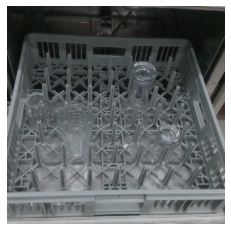

In [76]:
plt.imshow(transparent_matching[0,:,:,1:4] * 0.5 + 0.5)
plt.axis('off')

In [165]:
jbf0.dtype

dtype('float64')

In [166]:
cv2.Laplacian(jbf0, cv2.CV_64F).var() # padding 1 sigma_d 0.5 sigma_r 0.1

0.024875149279066425

In [168]:
cv2.Laplacian(jbf0, cv2.CV_64F).var() # padding 19 sigma_

0.0018819931423964859

In [154]:
print('Padding Sigma_D Sigma_R Overall_MAE Masked_MAE')
for i in range(len(overall_mae)):
    b = best[i]
    print(f'{b[0]:>7} {b[1]:>7} {b[2]:>7} {overall_mae[i]:>11.3} {masked_mae[i]:>10.3}')

Padding Sigma_D Sigma_R Overall_MAE Masked_MAE
      1     0.5     0.1        20.9       56.4
      1     0.5     0.1        20.9       56.4
      1     0.5     0.5        20.8       55.6
      1     0.5       1        20.8       55.5
      1     0.5       2        20.8       55.5
      1     0.5       4        20.8       55.4
      1       1     0.5        21.1       54.1
      1       1       1        21.1       54.1
      1       1       2        21.2       54.0
      1       1       4        21.2       54.0
      1       2     0.5        21.3       54.0
      1       2       1        21.4       53.9
      1       2       2        21.4       53.9
      1       2       4        21.5       53.9
      1       4       2        21.5       53.9
      1       4       4        21.5       53.9
      1       8       4        21.6       53.9
      1      16       4        21.6       53.9
      3       1     0.5        20.8       51.1
      3       1       1        20.8       51.0
      3      

In [146]:
ours_masked_mae[-10:]

[37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0, 37.0]

In [127]:
for b in best:
    print(b[3])

70.42982
70.42982
69.3211
69.167816
69.12257
69.11093
67.42145
67.27593
67.24488
67.23774
67.16867
67.073875
67.056496
67.05281
67.03971
67.03692
67.034996
67.03468
63.73651
63.46525
63.400375
63.384712
60.2631
59.990814
59.937122
59.925
59.0954
58.854694
58.816704
58.809002
58.59797
58.56669
58.56036
58.53693
58.507435
58.50176
58.09205
57.772438
57.70842
57.693848
54.673874
54.413467
54.379353
54.373817
53.769066
53.53992
53.517742
53.516083
53.335903
53.31857
52.266815
51.960716
51.91851
51.911133
50.439693
50.180733
50.1661
50.033592
49.79386
49.78774
48.102047
47.879208
47.87825
47.4721
47.305473
46.447998
46.278748
45.536526
45.48115
45.24341
45.11926
44.00313
42.675423
41.504337
40.442677


In [293]:
best_sigma_r

4

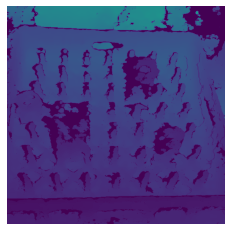

In [66]:
plot_depth_bin(transparent_matching[0,20:-20,20:-20,0])

In [75]:
mae_all = 0
mae_masked = 0
for i in range(10):
    depth_raw = decenter_and_descale_depth_bin(transparent_matching[i,:,:,0])
    gt_raw = decenter_and_descale_depth_bin(opaque_matching[i,:,:,0])
    mae_all += mae(depth_raw[gt_raw != 450] - gt_raw[gt_raw != 450]) / 10
    mae_masked += mae((depth_raw - gt_raw)[(masks_matching[i] == 1) & (gt_raw != 450)]) / 10
print(mae_all)
print(mae_masked)

20.595207595825194
56.796251678466795


In [72]:
masks_matching[0].shape
depth_raw.shape

TensorShape([472, 472])

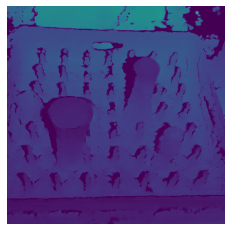

In [60]:
plot_depth_bin(generator_t2o(transparent_matching)[0,20:-20,20:-20,0])

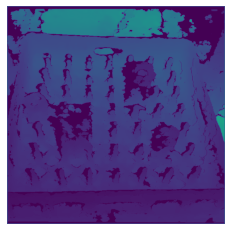

In [109]:
plot_depth_bin(filtered, save_as='test.png')

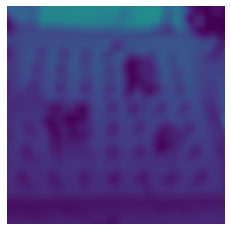

In [61]:
plot_depth_bin(bilateral_filter(transparent_matching[0,:,:,0].numpy(), np.zeros(shape=(512, 512), dtype=float), 512, 512, 14, 16, 4)[20:-20,20:-20])

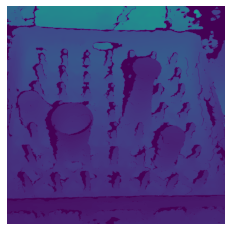

In [62]:
plot_depth_bin(opaque_matching[0,20:-20,20:-20,0])

In [63]:
def measure_bf():
    data = []
    n = 10
    for i in range(n):
        generated_opaque = bilateral_filter(transparent_matching[i,:,:,0].numpy(), np.zeros(shape=(512, 512), dtype=float), 512, 512, 14, 16, 4)
        opaque = opaque_matching[i]
        depth = generated_opaque[:,:]
        depth_raw = decenter_and_descale_depth_bin(depth)
        gt = opaque[:,:,0]
        gt_raw = decenter_and_descale_depth_bin(gt)
        transparent = tf.squeeze(transparent_matching[i])
        baseline = transparent[:,:,0]
        baseline_raw = decenter_and_descale_depth_bin(baseline)
        
        rel_depth_gt = rel(depth_raw, gt_raw)[gt_raw != 450]
        rel_depth_gt_match = rel(depth_raw, gt_raw)[(gt_raw != 450) & (masks_matching[i] == 1)]
        
        data.append([rmse(depth_raw[gt_raw != 450] - gt_raw[gt_raw != 450]),
                     rmse((depth_raw - gt_raw)[(masks_matching[i] == 1) & (gt_raw != 450)]),
                     mae(depth_raw[gt_raw != 450] - gt_raw[gt_raw != 450]),
                     mae((depth_raw - gt_raw)[(masks_matching[i] == 1) & (gt_raw != 450)]),
                     np.mean(rel_depth_gt),
                     np.mean(rel_depth_gt_match),
                     thresh(depth_raw, gt_raw, 0.05, masks_matching[i] == 1),
                     thresh(depth_raw, gt_raw, 0.10, masks_matching[i] == 1),
                     thresh(depth_raw, gt_raw, 0.25, masks_matching[i] == 1),
                     thresh(depth_raw, gt_raw, (math.pow(1.25, 2) - 1), masks_matching[i] == 1),
                     thresh(depth_raw, gt_raw, (math.pow(1.25, 3) - 1), masks_matching[i] == 1)
                    ])
        
        # print(f'Mean depth of predicted: {np.mean(depth_raw)}')
        # print(f'Mean depth of ground truth: {np.mean(gt_raw)}')
        # print(f'Mean depth of baseline: {np.mean(baseline_raw)}')
        # print(f'Mean depth of predicted (masked): {np.mean(depth_masked_raw[masks_matching[i] == 1])}')
        # print(f'Mean depth of ground truth (masked): {np.mean(gt_masked_raw[masks_matching[i] == 1])}')
        # print(f'Mean depth of baseline (masked): {np.mean(baseline_masked_raw[masks_matching[i] == 1])}')
        
        
    plt.show()
    pd.set_option('display.max_columns', 500)
    pd.set_option('display.width', 1000)
    df = pd.DataFrame(data, 
                      columns=["Bilateral Filter vs GT RMSE", 
                               "Bilateral Filter vs GT RMSE (masked)", 
                               "Bilateral Filter vs GT MAE", 
                               "Bilateral Filter vs GT MAE (masked)", 
                               "Relative error",
                               "Relative error (masked)",
                               "1.05",
                              "1.10",
                              "1.25",
                              "1.25 ** 2",
                              "1.25 ** 3"])
    df.loc['mean'] = df.mean()
    print(df)
measure_bf()

      Bilateral Filter vs GT RMSE  Bilateral Filter vs GT RMSE (masked)  Bilateral Filter vs GT MAE  Bilateral Filter vs GT MAE (masked)  Relative error  Relative error (masked)      1.05      1.10      1.25  1.25 ** 2  1.25 ** 3
0                      119.482635                             61.790783                   63.708633                            43.677227        0.092618                 0.070324  0.514672  0.701320  0.953956   0.997641   1.000000
1                      104.162239                             72.113663                   55.544052                            52.715202        0.086831                 0.096652  0.423688  0.649395  0.884788   1.000000   1.000000
2                       97.470825                             47.118484                   51.556252                            33.686886        0.073963                 0.057066  0.576416  0.787178  0.977080   0.999967   0.999967
3                      142.413651                             37.223251         

In [ ]:
out_img[20:-20,20:-20]

In [ ]:
transparent_matching[0,20:-20,20:-20,0] 

In [ ]:
generated_opaque = generator_t2o(transparent)
cycle_t = generator_o2t(generated_opaque)

transparent_squeeze = tf.squeeze(transparent)

transparent_color = transparent_squeeze[:,:,1:4] * 0.5 + 0.5
transparent_depth = transparent_squeeze[:,:,0]

generated_opaque_squeeze = tf.squeeze(generated_opaque)

generated_opaque_color = generated_opaque_squeeze[:,:,1:4] * 0.5 + 0.5
generated_opaque_depth = generated_opaque_squeeze[:,:,0]

In [ ]:
for i in range(len(transparent_matching)):
    plot_transparent2opaque(batch_it(transparent_matching[i]), generator_t2o, i, len(transparent_matching), ground_truth=opaque_matching[i])

In [ ]:
plot_depth_bin(transparent_matching[0,:,:,0])